In [1]:
from math import sqrt
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

#from feature_engine import missing_data_imputers as mdi
#from feature_engine import categorical_encoders as ce

from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm



# Partie 1 : Nettoyage des données :

### a) Regarder database, les variables :


In [2]:
%matplotlib inline
pd.pandas.set_option('display.max_columns', None)
with open('/Users/florinepritzy/Documents/3 projets/opioid_use_data.csv') as f:
    df = pd.read_csv(f)
f.close()
SEED = 42
df.shape
df.head(10)
df.info()
#we have 160615 observations with 92 features 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160616 entries, 0 to 160615
Data columns (total 92 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   ClaimID                          160616 non-null  int64  
 1   Accident DateID                  144713 non-null  float64
 2   Claim Setup DateID               160616 non-null  int64  
 3   Report To DateID                 160616 non-null  int64  
 4   Employer Notification DateID     160615 non-null  float64
 5   Benefits State                   160616 non-null  object 
 6   Accident State                   144713 non-null  object 
 7   Industry ID                      160616 non-null  int64  
 8   Claimant Age                     160616 non-null  int64  
 9   Claimant Sex                     160616 non-null  object 
 10  Claimant State                   160300 non-null  object 
 11  Claimant Marital Status          160616 non-null  object 
 12  Nu

/Users/florinepritzy/opt/anaconda3/envs/Keras/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3147: DtypeWarning: Columns (19) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### b) Informations manquantes : remplacer les X et "" en NaN  

#### Transforme toute l'information manquante en nan

In [3]:
for var in df.columns:
    print(var, df[var].unique(), '\n')

ClaimID [  7275  17596  13834 ... 182403 190166 182604] 

Accident DateID [33460.    nan 35043. ... 35553. 35592. 35565.] 

Claim Setup DateID [33467 34301 35054 ... 34716 34933 35003] 

Report To DateID [33462 34300 35050 ... 34241 33631 34283] 

Employer Notification DateID [33460. 34270. 35043. ... 32708. 32977. 35590.] 

Benefits State ['OK' 'CO' 'MD' 'IL' 'CA' 'GA' 'NJ' 'FL' 'WI' 'LA' 'AR' 'TX' 'AZ' 'MO'
 'NC' 'MN' 'PA' 'MI' 'NY' 'MA' 'VA' 'OH' 'RI' 'SC' 'CT' 'IA' 'AL' 'NV'
 'OR' 'HI' 'KY' 'TN' 'NE' 'IN' 'KS' 'MS' 'ME' 'LH' 'NH' 'UT' 'WA' 'DC'
 'DE' 'ID' 'NM' 'MT' 'WV' 'VT' 'SD' 'WY' 'JA' 'ND'] 

Accident State ['OK' nan 'MD' 'IL' 'CA' 'NJ' 'FL' 'WI' 'LA' 'AR' 'TX' 'AZ' 'CO' 'MO' 'MN'
 'MI' 'NY' 'MA' 'VA' 'GA' 'OH' 'RI' 'SC' 'IN' 'CT' 'IA' 'AL' 'OR' 'HI'
 '  ' 'NC' 'PA' 'NE' 'TN' 'KS' 'MS' 'KY' 'ME' 'NV' 'NH' 'ID' 'UT' 'WA'
 'DC' 'DE' 'NM' 'MT' 'WV' 'VT' 'QC' 'SD' 'WY' 'ND' 'PR' 'ON' 'AK' 'NB'
 'GU' 'AB' 'BC' 'NW' 'QU'] 

Industry ID [17  9 10  2 14 18  8 11 13  7 16 12 15  3  4  

In [4]:
# Converting nulls to np.nan
for var in df.columns:
    df[var].replace(to_replace=' ', value=np.nan, inplace=True)
    
# Converting values of "X" to np.nan
for var in df.columns:
    df[var].replace(to_replace='X', value=np.nan, inplace=True)

for var in df.columns:
    df[var].replace(to_replace='    ', value=np.nan, inplace=True)

###  c) Regarder le pourcentage de NA dans les variables : supprimer les variables avec plus de 50% de valeurs manquantes 

In [5]:
for var in df.columns:
    print(var, 'percent of missing values', df[var].isnull().mean().round(3)>0.5)
#Accident Source Code percent of missing values is true = have 50% of null

ClaimID percent of missing values False
Accident DateID percent of missing values False
Claim Setup DateID percent of missing values False
Report To DateID percent of missing values False
Employer Notification DateID percent of missing values False
Benefits State percent of missing values False
Accident State percent of missing values False
Industry ID percent of missing values False
Claimant Age percent of missing values False
Claimant Sex percent of missing values False
Claimant State percent of missing values False
Claimant Marital Status percent of missing values False
Number Dependents percent of missing values False
Weekly Wage percent of missing values False
Employment Status Flag percent of missing values False
RTW Restriction Flag percent of missing values False
Max Medical Improvement DateID percent of missing values True
Percent Impairment percent of missing values False
Post Injury Weekly Wage percent of missing values False
NCCI Job Code percent of missing values False
Sur

#### 2 variables apparaissent : "Accident Source Code" et "Max Medical Imporvement DateID"

In [6]:
df.drop('Accident Source Code', axis = 1, inplace = True)
df.drop('Max Medical Improvement DateID', axis = 1, inplace = True)

### d) Supprimer les variables qui n'apportent rien : variable ID 

In [7]:
for var in df.columns:
    print(var, df[var].nunique(), len(df))

#peut supprimer ClaimID = car c'est un ID unique pour chaque patient

ClaimID 160616 160616
Accident DateID 2508 160616
Claim Setup DateID 2396 160616
Report To DateID 2019 160616
Employer Notification DateID 2538 160616
Benefits State 52 160616
Accident State 61 160616
Industry ID 21 160616
Claimant Age 92 160616
Claimant Sex 3 160616
Claimant State 60 160616
Claimant Marital Status 4 160616
Number Dependents 16 160616
Weekly Wage 75472 160616
Employment Status Flag 12 160616
RTW Restriction Flag 2 160616
Percent Impairment 95 160616
Post Injury Weekly Wage 1355 160616
NCCI Job Code 2071 160616
Surgery Flag 2 160616
Disability Status 4 160616
SIC Group 51 160616
NCCI BINatureOfLossDescription 15 160616
Accident Type Group 16 160616
Neurology Payment Flag 2 160616
Neurosurgery Payment Flag 2 160616
Dentist Payment Flag 2 160616
Orthopedic Surgery Payment Flag 2 160616
Psychiatry Payment Flag 2 160616
Hand Surgery Payment Flag 2 160616
Optometrist Payment Flag 2 160616
Podiatry Payment Flag 2 160616
HCPCS A Codes 37 160616
HCPCS B Codes 3 160616
HCPCS C C

#### 1 variable apparait : "ClaimID"

In [8]:
df.drop ('ClaimID', axis = 1, inplace = True)

### e) Regarde la corrélation entre les variables 
#### Matrice de corrélation : afficher la corrélation entre les variables numériques

In [9]:
corr_matrix = df.corr().abs() #take absolute value of matrice correlation : want positive value 
corr_matrix

,Accident DateID,Claim Setup DateID,Report To DateID,Employer Notification DateID,Industry ID,Claimant Age,Number Dependents,Weekly Wage,Percent Impairment,Post Injury Weekly Wage,Surgery Flag,Neurology Payment Flag,Neurosurgery Payment Flag,Dentist Payment Flag,Orthopedic Surgery Payment Flag,Psychiatry Payment Flag,Hand Surgery Payment Flag,Optometrist Payment Flag,Podiatry Payment Flag,HCPCS A Codes,HCPCS B Codes,HCPCS C Codes,HCPCS D Codes,HCPCS E Codes,HCPCS F Codes,HCPCS G Codes,HCPCS H Codes,HCPCS I Codes,HCPCS J Codes,HCPCS K Codes,HCPCS L Codes,HCPCS M Codes,HCPCS N Codes,HCPCS O Codes,HCPCS P Codes,HCPCS Q Codes,HCPCS R Codes,HCPCS S Codes,HCPCS T Codes,HCPCS U Codes,HCPCS V Codes,HCPCS W Codes,HCPCS X Codes,HCPCS Y Codes,HCPCS Z Codes,ICD Group 1,ICD Group 2,ICD Group 3,ICD Group 4,ICD Group 5,ICD Group 6,ICD Group 7,ICD Group 8,ICD Group 9,ICD Group 10,ICD Group 11,ICD Group 12,ICD Group 13,ICD Group 14,ICD Group 15,ICD Group 16,ICD Group 17,ICD Group 18,ICD Group 19,ICD Group 20,ICD Group 21,CPT Category - Anesthesia,CPT Category - Eval_Mgmt,CPT Category - Medicine,CPT Category - Path_Lab,CPT Category - Radiology,CPT Category - Surgery,NDC Class - Benzo,NDC Class - Misc (Zolpidem),NDC Class - Muscle Relaxants,NDC Class - Stimulants,Opiods Used
Accident DateID,1.000000,0.992483,0.993462,0.995020,0.004154,0.010695,0.036018,0.010670,0.134289,0.049074,0.135031,0.038273,0.037529,0.019431,0.091537,0.057880,0.018759,0.004128,0.066799,0.085595,0.004589,0.010104,0.006228,0.108151,0.033867,0.030992,0.005061,0.008981,0.066734,0.016273,0.068934,0.103838,0.049762,0.018378,0.043105,0.036460,0.008612,0.034857,0.029229,0.001773,0.007001,0.094704,0.003217,0.002318,0.049492,0.039893,0.037396,0.028689,0.040333,0.071203,0.171896,0.033241,0.033784,0.066827,0.047526,0.067651,0.054951,0.315585,0.038981,0.008637,0.014260,0.039070,0.135190,0.052350,0.031032,0.186262,0.124726,0.160121,0.190538,0.106322,0.135261,0.149116,0.044144,0.052774,0.070667,0.001963,0.145555
Claim Setup DateID,0.992483,1.000000,0.999172,0.997141,0.003075,0.004492,0.041018,0.007758,0.127034,0.044831,0.136179,0.038616,0.038605,0.020792,0.096506,0.061228,0.019982,0.006546,0.069855,0.089091,0.005886,0.012562,0.003996,0.109118,0.033712,0.029270,0.005735,0.006528,0.072640,0.016624,0.076742,0.091498,0.051455,0.018336,0.043757,0.039663,0.007898,0.037829,0.016988,0.001232,0.007632,0.099099,0.000462,0.001960,0.047623,0.041074,0.040108,0.031985,0.042532,0.076875,0.177359,0.035814,0.035641,0.072057,0.051272,0.072338,0.060656,0.332064,0.041857,0.010600,0.014043,0.042083,0.144563,0.061913,0.032623,0.199341,0.130649,0.176621,0.193041,0.107506,0.140116,0.154839,0.043585,0.052496,0.073857,0.001477,0.147656
Report To DateID,0.993462,0.999172,1.000000,0.997972,0.003196,0.005053,0.040825,0.008037,0.127554,0.044856,0.135707,0.038550,0.038562,0.020794,0.096098,0.061112,0.019748,0.006329,0.069654,0.088358,0.005850,0.012360,0.003884,0.108746,0.033553,0.029431,0.005795,0.006528,0.072018,0.016496,0.075972,0.091741,0.051531,0.018322,0.043714,0.039290,0.007914,0.037552,0.017190,0.001236,0.007636,0.099280,0.000589,0.001946,0.047787,0.040998,0.040109,0.031834,0.042384,0.076908,0.177104,0.035678,0.035569,0.071881,0.051053,0.072168,0.060427,0.331684,0.041741,0.010529,0.014000,0.041984,0.144216,0.061503,0.032521,0.198877,0.130218,0.174589,0.192106,0.107225,0.139071,0.154095,0.043639,0.052403,0.073427,0.001432,0.147189
Employer Notification DateID,0.995020,0.997141,0.997972,1.000000,0.003700,0.005873,0.040124,0.008282,0.129576,0.045137,0.136051,0.038167,0.038300,0.020343,0.095763,0.060964,0.019722,0.006098,0.069111,0.086754,0.005799,0.012028,0.003462,0.108258,0.033666,0.029069,0.005694,0.007358,0.070926,0.016203,0.074218,0.093612,0.051077,0.018320,0.043691,0.038263,0.007734,0.037137,0.018760,0.001185,0.007918,0.097908,0.000971,0.001885,0.047889,0.040780,0.040103,0.031602,0.042154,0.077236,0.177495,0.035389,0.035578,0.071497,0.050753,0.072033,0.059915,0.331106,0.041405,0.010295,0.013986,0.041849,0.143

In [10]:
df.corr(method='spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'))

In [11]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find features with correlation greater than 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]

In [12]:
to_drop #On a 3 variables avec une corrélation plus grande que 0.8 dans la matrice : on doit donc les enlever de notre dataset

['Claim Setup DateID', 'Report To DateID', 'Employer Notification DateID']

#### On a 3 variables qui ont une forte colinéarité : on peut les supprimer. Regle : | rij| >0,8 donc detection de colinearité entre ces 3 variables 

In [13]:
df.drop(df[to_drop], axis=1, inplace=True) #drop 4 variables 

### f) Regarder trois variables catégorielles qui traduisent la même information 

In [14]:
states = pd.DataFrame(df[['Claimant State', 'Accident State', 'Benefits State']])
states


,Claimant State,Accident State,Benefits State
0,OK,OK,OK
1,CO,NaN,CO
2,VA,MD,MD
3,IL,IL,IL
4,WI,IL,IL
...,...,...,...
160611,PA,PA,PA
160612,PA,PA,PA
160613,PA,NaN,PA
160614,AZ,AZ,AZ


In [15]:
print(states['Claimant State'].isnull().values.sum()) #316
print(states["Accident State"].isnull().values.sum()) #15903
print(states['Benefits State'].isnull().values.sum())  #0 = garder cette variable la 

316
15903
0


#### On voit que la variable la plus complète est "Benefits State": on garde cette variable 
Garde la variable Benefits Stats = qui traduisait la même information que Claimant State et Accident State mais sans valeurs manquantes 

In [16]:
df.drop(['Claimant State', 'Accident State'], axis=1, inplace=True) 

### g) Transforme la variable Accident en un seul type : devient 2 variables, garde que la variable numérique

In [17]:
# Splitting out "Accident Type Group" (ie. mixed type feature) into separate features
df['Accident Type Group num'] = df['Accident Type Group'].str.extract('(\d+)')
df['Accident Type Group str'] = df['Accident Type Group'].str[0:5]
df.drop(['Accident Type Group'], axis=1, inplace=True)

In [18]:
df['Accident Type Group num']

0           7
1           6
2         NaN
3           6
4           1
         ... 
160611      5
160612      6
160613      1
160614      5
160615      7
Name: Accident Type Group num, Length: 160616, dtype: object

In [19]:
df.drop(['Accident Type Group str'], axis=1, inplace=True) 

### h) Traitement des missing values

####  Les différentes manières d'avoir des données manquantes  :
- Quand la valeur d’une variable explicative (feature) X est manquante, on dit que cette feature est MCAR (Missing Completly At Random) si et seulement si la probabilité que la valeur soit manquante est indépendant des valeurs prises par les autres variables explicatives de l’observation, qu’elles soient manquantes ou non = peut pas deviner l'information avec une autre variable 
- On dit que les données manquantes d’une feature X sont Missing At Random (MAR) si et seulement si, la probabilité qu’une valeur X soit manquante est corrélée à l’existence de variables explicatives dont les valeurs sont renseignées. Par contre cette probabilité n’est pas corrélée à l’absence de valeurs  de variables explicatives.
- NMAR = il existe un pattern qui motive l’absence d’une valeur = ex = les gens les plus fortunés ne veulent pas dire leurs salaires. Délicates à traiter car l’absence d’une donnée est motivée par une cause que nous avons interêt à comprendre pour mieux traiter ces données absentes.
#### Les 2 premières sont ignorables mais pas NMAR= doit comprendre pourquoi il n'y a pas l'information

#### Techniques :
- 1) supprime l'information = l'observation
- 2) remplace valeur manquante par soit règle si on a une variable qui nous aide / remplace par moyenne pour quanti et mode pour quali 
- 3) Hot Deck = choisi aléatoirement autres valeurs

In [20]:
for var in df.columns:
    if df[var].isnull().sum() > 0:
        print(var, df[var].isnull().mean()) #toutes les variables qui ont des missing values

Accident DateID 0.09901255167604722
Claimant Sex 0.0019674254121631717
Claimant Marital Status 0.0019674254121631717
Employment Status Flag 0.0021666583652936197
RTW Restriction Flag 0.22657144991781641
NCCI Job Code 1.2452059570652986e-05
Disability Status 0.1311762215470439
NCCI BINatureOfLossDescription 0.08981670568311999
Accident Type Group num 0.06542934701399611


#### On a 1 variable quantitative et 7 variables qualitatives 
- Nous avons décidé de supprimer les variables qui ont plus que 20% de NA (RTW Restriction Flag)
- Nous supprimons également la variable Accident DateID= qui correspond à une date aléatoire, inexploitable


In [21]:
df.drop(['RTW Restriction Flag','Accident DateID'], axis = 1, inplace = True)

#### NCCI Job Code : 
La NCCI est une organisation à but non lucratif financée par les compagnies d'assurance sur le marché de l'indemnisation des travailleurs. C'est une base de données qui est utilisée par les professionnels de l'assurance pour identifier les codes de classe d'indemnisation des accidents du travail associés à chaque employé en fonction des activités que les employés exercent dans le cadre de leur travail. Chaque année, il existe entre 700 et 800 codes de classification individuels. Or ces codes n'ont pas été harmonisé pour chaque état, ce qui rend la variable très complexe. En effets, elle a 5040 valeurs différentes. Elle n'apporte rien à notre database, nous avons décidé de la supprimer 

In [22]:
df.drop(['NCCI Job Code'], axis=1, inplace=True) 

#### Claimant Sex and Claimant Marital Statuts : 
Ce sont les mêmes 316 individus qui n'ont pas déclaré leur sexe, ni leur statut marital. Nous pouvons les mettre dans la catégorie "unknown". Soit ces informations n'étaient pas disponibles pour l'assurance car les individus n'ont pas voulu le dire, soit un oubli a été fait. 

In [23]:
print(df[["Claimant Sex", "Claimant Marital Status"]].isnull().sum())

Claimant Sex               316
Claimant Marital Status    316
dtype: int64


In [24]:
df_SEX = df[["Claimant Sex", "Claimant Marital Status"]].copy()

df_SEX.set_index("Claimant Marital Status").isna().sum(level=0) #ok même individus 
df_SEX.set_index("Claimant Sex").isna().sum(level=0) #ok même individus 

,Claimant Marital Status
Claimant Sex,
M,0
F,0
U,0


In [25]:
df["Claimant Sex"].fillna("U", inplace = True)

In [26]:
df["Claimant Marital Status"].fillna("U", inplace = True)

In [27]:
df["Claimant Sex"].value_counts()

M    96719
F    62699
U     1198
Name: Claimant Sex, dtype: int64

#### Employment Status Flag :
On peut voir qu'il y a seulement 348 individus qui n'ont pas répondu à cette information. C'est également les individus qui sont indiqués en unknown pour "sexe" and "marital statuts" : 317 individus

In [28]:
print(df[["Employment Status Flag"]].isnull().sum())

Employment Status Flag    348
dtype: int64


In [29]:
df= df.dropna(subset=["Employment Status Flag"], axis=0, how='any')

In [30]:
df["Claimant Sex"].value_counts()

M    96697
F    62690
U      881
Name: Claimant Sex, dtype: int64

#### Disability Status :

In [31]:
print(df[["Disability Status"]].isnull().sum())

Disability Status    21016
dtype: int64


In [32]:
df= df.dropna(subset=["Disability Status"], axis=0, how='any')

#### NCCI BINatureOfLossDescription : 

In [33]:
print(df[["NCCI BINatureOfLossDescription"]].isnull().sum())

NCCI BINatureOfLossDescription    11376
dtype: int64


In [34]:
df= df.dropna(subset=["NCCI BINatureOfLossDescription"], axis=0, how='any')

#### Accident Type Group num : 

In [35]:
print(df[["Accident Type Group num"]].isnull().sum())

Accident Type Group num    7215
dtype: int64


In [36]:
df= df.dropna(subset=["Accident Type Group num"], axis=0, how='any')

In [37]:
df

,Benefits State,Industry ID,Claimant Age,Claimant Sex,Claimant Marital Status,Number Dependents,Weekly Wage,Employment Status Flag,Percent Impairment,Post Injury Weekly Wage,Surgery Flag,Disability Status,SIC Group,NCCI BINatureOfLossDescription,Neurology Payment Flag,Neurosurgery Payment Flag,Dentist Payment Flag,Orthopedic Surgery Payment Flag,Psychiatry Payment Flag,Hand Surgery Payment Flag,Optometrist Payment Flag,Podiatry Payment Flag,HCPCS A Codes,HCPCS B Codes,HCPCS C Codes,HCPCS D Codes,HCPCS E Codes,HCPCS F Codes,HCPCS G Codes,HCPCS H Codes,HCPCS I Codes,HCPCS J Codes,HCPCS K Codes,HCPCS L Codes,HCPCS M Codes,HCPCS N Codes,HCPCS O Codes,HCPCS P Codes,HCPCS Q Codes,HCPCS R Codes,HCPCS S Codes,HCPCS T Codes,HCPCS U Codes,HCPCS V Codes,HCPCS W Codes,HCPCS X Codes,HCPCS Y Codes,HCPCS Z Codes,ICD Group 1,ICD Group 2,ICD Group 3,ICD Group 4,ICD Group 5,ICD Group 6,ICD Group 7,ICD Group 8,ICD Group 9,ICD Group 10,ICD Group 11,ICD Group 12,ICD Group 13,ICD Group 14,ICD Group 15,ICD Group 16,ICD Group 17,ICD Group 18,ICD Group 19,ICD Group 20,ICD Group 21,CPT Category - Anesthesia,CPT Category - Eval_Mgmt,CPT Category - Medicine,CPT Category - Path_Lab,CPT Category - Radiology,CPT Category - Surgery,NDC Class - Benzo,NDC Class - Misc (Zolpidem),NDC Class - Muscle Relaxants,NDC Class - Stimulants,Opiods Used,Accident Type Group num
0,OK,17,41,M,M,0,513.86,F,0,0.0,0,TTD,Gen. cont.,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,12,0,0,0,7,1,3,5,1,0,0,0,0,False,7
1,CO,17,49,M,M,0,1186.00,F,10,0.0,0,PPD,Gen. cont.,Inflammation,False,False,False,True,False,False,False,True,3,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,2,0,0,0,0,0,0,12,0,0,0,0,0,12,0,4,1,4,12,1,4,9,0,0,0,0,True,6
3,IL,9,35,F,M,0,300.00,P,0,0.0,0,TTD,Misc. Manuf. Ind.,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,1,0,2,0,0,0,1,0,False,6
4,IL,9,30,F,M,0,600.00,F,0,0.0,0,TTD,Misc. Manuf. Ind.,Contusions,False,False,False,False,False,False,False,False,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,2,6,0,0,0,2,4,0,6,0,0,0,0,0,False,1
5,CA,10,41,M,S,0,385.07,F,6,0.0,0,PPD,Misc. Services,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160609,NJ,7,62,F,M,0,1504.00,F,0,0.0,0,TTD,Health Services,Fractures,False,False,False,False,False,False,False,False,1,0,0,0,2,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,2,0,2,0,3,2,0,1,4,0,0,0,0,False,5
160611,PA,12,50,M,S,0,200.00,F,0,0.0,1,TTD,Eating & Drnkng.Places,Fractures,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,948,0,2,1,3,9,1,4,1,0,0,0,0,False,5
160612,PA,7,52,F,M,0,1258.46,P,0,0.0,0,TTD,Health Services,Sprain,False,False,False,False,False,False,False,False,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16,0,0,0,4,7,0,4,1,0,0,0,0,False,6
160613,PA,16,22,M,S,0,448.00,F,0,0.0,0,TTD,Misc. Services,Lacerations/Scarring,False,False,False,True,False,False,False,False,4,0,0,0,1,0,5,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,944,0,0,1,10,21,6,5,4,0,0,0,0,True,1


#### Autre database avec les NaN de ces 3 variables : NCCI BINatureOfLossDescription/ Accident Type Group num/ Disability Statuts 

Nous décidons finalement de supprimer les lignes de ces variables et de ne pas remplacer par le mode car cela modifie trop notre distributions. Notre database est plus petite 

### h) 84 variables : doit ranger par types puis recoder

In [38]:
categorical = ['Benefits State', 'Industry ID', 'Claimant Sex', 'Claimant Marital Status', 'Employment Status Flag', 
'Surgery Flag', 'Disability Status', 'SIC Group', 'NCCI BINatureOfLossDescription',
'Orthopedic Surgery Payment Flag','Neurology Payment Flag', 'Neurosurgery Payment Flag', 'Dentist Payment Flag',
         'Psychiatry Payment Flag', 'Hand Surgery Payment Flag', 'Optometrist Payment Flag',
         'Podiatry Payment Flag', 'Accident Type Group num']


In [39]:
len(categorical)

18

In [40]:
discrete = ['Claimant Age', 'Number Dependents', 'Percent Impairment', 'HCPCS A Codes',
'HCPCS E Codes', 'HCPCS G Codes', 'HCPCS J Codes','HCPCS L Codes', 'HCPCS W Codes', 
'ICD Group 6', 'ICD Group 13','ICD Group 18', 'ICD Group 19', 'ICD Group 21', 
'CPT Category - Anesthesia', 'CPT Category - Eval_Mgmt', 'CPT Category - Medicine', 
'CPT Category - Path_Lab', 'CPT Category - Radiology', 'CPT Category - Surgery', 
'NDC Class - Muscle Relaxants','HCPCS B Codes','HCPCS C Codes', 'HCPCS D Codes', 'HCPCS F Codes', 'HCPCS H Codes', 'HCPCS I Codes',
'HCPCS K Codes', 'HCPCS M Codes', 'HCPCS N Codes', 'HCPCS O Codes', 'HCPCS P Codes',
'HCPCS Q Codes', 'HCPCS R Codes', 'HCPCS S Codes', 'HCPCS T Codes', 'HCPCS U Codes', 
'HCPCS V Codes', 'HCPCS X Codes', 'HCPCS Y Codes', 'HCPCS Z Codes', 'ICD Group 1',
'ICD Group 2', 'ICD Group 3', 'ICD Group 4', 'ICD Group 5', 'ICD Group 7', 'ICD Group 8', 
'ICD Group 9', 'ICD Group 10', 'ICD Group 11', 'ICD Group 12', 'ICD Group 14', 'ICD Group 15', 
'ICD Group 16', 'ICD Group 17', 'ICD Group 20', 'NDC Class - Benzo', 'NDC Class - Misc (Zolpidem)',
'NDC Class - Stimulants']

In [41]:
len(discrete)

60

In [42]:
continuous = ['Weekly Wage','Post Injury Weekly Wage' ]


In [43]:
len(continuous)

2

In [44]:
df.columns,'Number of Features:',len(df.columns)

(Index(['Benefits State', 'Industry ID', 'Claimant Age', 'Claimant Sex',
        'Claimant Marital Status', 'Number Dependents', 'Weekly Wage',
        'Employment Status Flag', 'Percent Impairment',
        'Post Injury Weekly Wage', 'Surgery Flag', 'Disability Status',
        'SIC Group', 'NCCI BINatureOfLossDescription', 'Neurology Payment Flag',
        'Neurosurgery Payment Flag', 'Dentist Payment Flag',
        'Orthopedic Surgery Payment Flag', 'Psychiatry Payment Flag',
        'Hand Surgery Payment Flag', 'Optometrist Payment Flag',
        'Podiatry Payment Flag', 'HCPCS A Codes', 'HCPCS B Codes',
        'HCPCS C Codes', 'HCPCS D Codes', 'HCPCS E Codes', 'HCPCS F Codes',
        'HCPCS G Codes', 'HCPCS H Codes', 'HCPCS I Codes', 'HCPCS J Codes',
        'HCPCS K Codes', 'HCPCS L Codes', 'HCPCS M Codes', 'HCPCS N Codes',
        'HCPCS O Codes', 'HCPCS P Codes', 'HCPCS Q Codes', 'HCPCS R Codes',
        'HCPCS S Codes', 'HCPCS T Codes', 'HCPCS U Codes', 'HCPCS V Codes',
    

In [45]:
df

,Benefits State,Industry ID,Claimant Age,Claimant Sex,Claimant Marital Status,Number Dependents,Weekly Wage,Employment Status Flag,Percent Impairment,Post Injury Weekly Wage,Surgery Flag,Disability Status,SIC Group,NCCI BINatureOfLossDescription,Neurology Payment Flag,Neurosurgery Payment Flag,Dentist Payment Flag,Orthopedic Surgery Payment Flag,Psychiatry Payment Flag,Hand Surgery Payment Flag,Optometrist Payment Flag,Podiatry Payment Flag,HCPCS A Codes,HCPCS B Codes,HCPCS C Codes,HCPCS D Codes,HCPCS E Codes,HCPCS F Codes,HCPCS G Codes,HCPCS H Codes,HCPCS I Codes,HCPCS J Codes,HCPCS K Codes,HCPCS L Codes,HCPCS M Codes,HCPCS N Codes,HCPCS O Codes,HCPCS P Codes,HCPCS Q Codes,HCPCS R Codes,HCPCS S Codes,HCPCS T Codes,HCPCS U Codes,HCPCS V Codes,HCPCS W Codes,HCPCS X Codes,HCPCS Y Codes,HCPCS Z Codes,ICD Group 1,ICD Group 2,ICD Group 3,ICD Group 4,ICD Group 5,ICD Group 6,ICD Group 7,ICD Group 8,ICD Group 9,ICD Group 10,ICD Group 11,ICD Group 12,ICD Group 13,ICD Group 14,ICD Group 15,ICD Group 16,ICD Group 17,ICD Group 18,ICD Group 19,ICD Group 20,ICD Group 21,CPT Category - Anesthesia,CPT Category - Eval_Mgmt,CPT Category - Medicine,CPT Category - Path_Lab,CPT Category - Radiology,CPT Category - Surgery,NDC Class - Benzo,NDC Class - Misc (Zolpidem),NDC Class - Muscle Relaxants,NDC Class - Stimulants,Opiods Used,Accident Type Group num
0,OK,17,41,M,M,0,513.86,F,0,0.0,0,TTD,Gen. cont.,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,12,0,0,0,7,1,3,5,1,0,0,0,0,False,7
1,CO,17,49,M,M,0,1186.00,F,10,0.0,0,PPD,Gen. cont.,Inflammation,False,False,False,True,False,False,False,True,3,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,2,0,0,0,0,0,0,12,0,0,0,0,0,12,0,4,1,4,12,1,4,9,0,0,0,0,True,6
3,IL,9,35,F,M,0,300.00,P,0,0.0,0,TTD,Misc. Manuf. Ind.,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,1,0,2,0,0,0,1,0,False,6
4,IL,9,30,F,M,0,600.00,F,0,0.0,0,TTD,Misc. Manuf. Ind.,Contusions,False,False,False,False,False,False,False,False,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,2,6,0,0,0,2,4,0,6,0,0,0,0,0,False,1
5,CA,10,41,M,S,0,385.07,F,6,0.0,0,PPD,Misc. Services,Strain,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160609,NJ,7,62,F,M,0,1504.00,F,0,0.0,0,TTD,Health Services,Fractures,False,False,False,False,False,False,False,False,1,0,0,0,2,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,2,0,2,0,3,2,0,1,4,0,0,0,0,False,5
160611,PA,12,50,M,S,0,200.00,F,0,0.0,1,TTD,Eating & Drnkng.Places,Fractures,False,False,False,False,False,False,False,False,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,948,0,2,1,3,9,1,4,1,0,0,0,0,False,5
160612,PA,7,52,F,M,0,1258.46,P,0,0.0,0,TTD,Health Services,Sprain,False,False,False,False,False,False,False,False,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16,0,0,0,4,7,0,4,1,0,0,0,0,False,6
160613,PA,16,22,M,S,0,448.00,F,0,0.0,0,TTD,Misc. Services,Lacerations/Scarring,False,False,False,True,False,False,False,False,4,0,0,0,1,0,5,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,944,0,0,1,10,21,6,5,4,0,0,0,0,True,1


##### 1) Recodage des variables de categorical 

#### SIC Group : recode puis diminue le nombre de classes: transfrom SIC 36 into SIC
- 1-9:Agriculture,Forestry,Fishing
- 10-14:Mining
- 15-17:Construction
- 20-39:Manufacturing
- 40-49:Transportation
- 50-51: Wholesale,Trade
- 52-59: Retail Trade
- 60-67: Finance, Insurance
- 70-89: Services
- 91-99: Public Administration

In [46]:
df['SIC Group'].unique()
df['SIC Group'] = df['SIC Group'].replace(['Gen. cont.', 'Misc. Manuf. Ind.', 'Misc. Services',
       'Business Services', 'Trans. Equip.', 'Ins. Agnts. Brkrs. & Ser.',
       'Real Estate', 'Nonprofit Membshp. Org.',
       'Engineering & Management Services', 'Food and Kindred Prod.',
       'Health Services', 'Rub. & Misc. Plas. Prod.',
       'Executive, Legislative, and General',
       'Elec. Elect. Mach.Equip.& Sup.', 'Other',
       'Eating & Drnkng.Places', 'Social Services', 'Trans. by Air',
       'Misc. Retail', 'Communication', 'Ins. Carriers',
       'Motor Frgt.Trns.&Wrhsng.',
       'Hotls,Rmng. Hses. Cmps.& Oth. Lodg.Plcs.',
       'Trans.Serv.Frgt.Frwdg.Etc.', 'App.& Oth.Fin.Prod.',
       'Autom. Dlrs. & Gas. Ser.Stat.', 'Trans.Serv.Frgt.FRwdg.Etc.',
       'Hldng.& Oth. Inv. Co.', 'Amusemt. & Rec. Ser.ex. Mot. Pics.',
       'Educational Services', 'Tex. Mill Prod.', 'Whlsale Trade,Non',
       'Stone,Clay,Gls.&Conc.Prod.', 'Whlsale Trade,Dur.Gds.',
       'Loc.&Subur. Trnst.& Inturb.', 'Appl. & Acces. Stores',
       'Food Stores', 'Oil & Gas Extraction', 'Commercial printing, nec',
       'Chem. & Alld. Prod.', 'Stationery products',
       'Elec. Gas, & San.Serv.', 'Mach., Ex. Elec.', 
                                           'Per. Service','Primy. Metal Ind.', 
                                           'Agricultural Production', 
                                           'Furn. & Fixt.',
                                           'Newspapers:publishing, publishing & printing',
                                           'Auto. Repr. Serv.& Gar.', 
                                           'Hardware stores', 
                                           'Banking'], ["construction","manufacturing","services",
                                                                  "services","manufacturing","finance",
                                                                  "finance","public_admi","services","manufacturing",
                                                                  "services","manufacturing","public_admi","manufacturing",
                                                                  "public_admi","retail_trade","services","transportation",
                                                                  "retail_trade","services","finance","transportation",
                                                                 "services","transportation","manufacturing","services",
                                                                  "transportation","finance","services","services",
                                                                  "manufacturing","whole_sale_trade","manufacturing",
                                                                  "whole_sale_trade","transportation","retail_trade",
                                                                  "retail_trade","mining","manufacturing","manufacturing",
                                                                  "retail_trade",
                                                                    "transportation",
                                                                    "manufacturing",
                                                                  "services",
                                                                  "manufacturing",
                                                                  "agriculture",
                                                                  "manufacturing",
                                                                  "manufacturing",
                                                                  "retail_trade",
                                                                  "retail_trade",
                                                                  "finance"])

In [47]:
df['SIC Group'].unique()

array(['construction', 'manufacturing', 'services', 'finance',
       'public_admi', 'transportation', 'retail_trade',
       'whole_sale_trade', 'mining', 'agriculture'], dtype=object)

df = 120000 rows 
df1 = 160000 rows 

One hot encoding for the categorical features

In [48]:
df[['SIC Group','Disability Status','Claimant Sex', 'Claimant Marital Status', 'Employment Status Flag', 
'NCCI BINatureOfLossDescription','Accident Type Group num']].astype('object')

,SIC Group,Disability Status,Claimant Sex,Claimant Marital Status,Employment Status Flag,NCCI BINatureOfLossDescription,Accident Type Group num
0,construction,TTD,M,M,F,Strain,7
1,construction,PPD,M,M,F,Inflammation,6
3,manufacturing,TTD,F,M,P,Strain,6
4,manufacturing,TTD,F,M,F,Contusions,1
5,services,PPD,M,S,F,Strain,6
...,...,...,...,...,...,...,...
160609,services,TTD,F,M,F,Fractures,5
160611,retail_trade,TTD,M,S,F,Fractures,5
160612,services,TTD,F,M,P,Sprain,6
160613,services,TTD,M,S,F,Lacerations/Scarring,1


In [49]:
df['Industry ID']=df['Industry ID'].astype('object')

Ordinateur d'Ivanna pour feature engine :

In [ ]:
import feature_engine 
from feature_engine import CategoricalEncoder 
encoder = ce.OneHotCategoricalEncoder(
    top_categories=52,
    variables=['Benefits State','SIC Group','Disability Status','Claimant Sex', 'Claimant Marital Status', 'Employment Status Flag', 
'NCCI BINatureOfLossDescription','Accident Type Group num','Industry ID'],
    drop_last=False)
encoder.fit(df)
df_t= encoder.transform(df)
df=df_t
df

In [ ]:
# We will use one_hot_encoding for categorical features
ce.OneHotCategoricalEncoder(variables=['Benefits State', 'Industry ID', 'Claimant Sex','Claimant Marital Status','Employment Status Flag','RTW Restriction Flag','Disability Status','SIC Group','NCCI Job Code','NCCI BINatureOfLossDescription','Accident Source Code','Accident Type Group num'],drop_last=True),

In [51]:
df['Orthopedic Surgery Payment Flag'] = df['Orthopedic Surgery Payment Flag'].replace([True, False], [1, 0])
df['Neurology Payment Flag'] = df['Neurology Payment Flag'].replace([True, False], [1, 0])
df['Neurosurgery Payment Flag'] = df['Neurosurgery Payment Flag'].replace([True, False], [1, 0])
df['Dentist Payment Flag'] = df['Dentist Payment Flag'].replace([True, False], [1, 0])
df['Psychiatry Payment Flag'] = df['Psychiatry Payment Flag'].replace([True, False], [1, 0])
df['Hand Surgery Payment Flag'] = df['Hand Surgery Payment Flag'].replace([True, False], [1, 0])
df['Optometrist Payment Flag'] = df['Optometrist Payment Flag'].replace([True, False], [1, 0])
df['Podiatry Payment Flag'] = df['Podiatry Payment Flag'].replace([True, False], [1, 0])

In [52]:
df['Opiods Used']= df['Opiods Used'].replace([True,False], [1,0])

In [53]:
df

,Benefits State,Industry ID,Claimant Age,Claimant Sex,Claimant Marital Status,Number Dependents,Weekly Wage,Employment Status Flag,Percent Impairment,Post Injury Weekly Wage,Surgery Flag,Disability Status,SIC Group,NCCI BINatureOfLossDescription,Neurology Payment Flag,Neurosurgery Payment Flag,Dentist Payment Flag,Orthopedic Surgery Payment Flag,Psychiatry Payment Flag,Hand Surgery Payment Flag,Optometrist Payment Flag,Podiatry Payment Flag,HCPCS A Codes,HCPCS B Codes,HCPCS C Codes,HCPCS D Codes,HCPCS E Codes,HCPCS F Codes,HCPCS G Codes,HCPCS H Codes,HCPCS I Codes,HCPCS J Codes,HCPCS K Codes,HCPCS L Codes,HCPCS M Codes,HCPCS N Codes,HCPCS O Codes,HCPCS P Codes,HCPCS Q Codes,HCPCS R Codes,HCPCS S Codes,HCPCS T Codes,HCPCS U Codes,HCPCS V Codes,HCPCS W Codes,HCPCS X Codes,HCPCS Y Codes,HCPCS Z Codes,ICD Group 1,ICD Group 2,ICD Group 3,ICD Group 4,ICD Group 5,ICD Group 6,ICD Group 7,ICD Group 8,ICD Group 9,ICD Group 10,ICD Group 11,ICD Group 12,ICD Group 13,ICD Group 14,ICD Group 15,ICD Group 16,ICD Group 17,ICD Group 18,ICD Group 19,ICD Group 20,ICD Group 21,CPT Category - Anesthesia,CPT Category - Eval_Mgmt,CPT Category - Medicine,CPT Category - Path_Lab,CPT Category - Radiology,CPT Category - Surgery,NDC Class - Benzo,NDC Class - Misc (Zolpidem),NDC Class - Muscle Relaxants,NDC Class - Stimulants,Opiods Used,Accident Type Group num
0,OK,17,41,M,M,0,513.86,F,0,0.0,0,TTD,construction,Strain,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,12,0,0,0,7,1,3,5,1,0,0,0,0,0,7
1,CO,17,49,M,M,0,1186.00,F,10,0.0,0,PPD,construction,Inflammation,0,0,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,2,0,0,0,0,0,0,12,0,0,0,0,0,12,0,4,1,4,12,1,4,9,0,0,0,0,1,6
3,IL,9,35,F,M,0,300.00,P,0,0.0,0,TTD,manufacturing,Strain,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,1,0,2,0,0,0,1,0,0,6
4,IL,9,30,F,M,0,600.00,F,0,0.0,0,TTD,manufacturing,Contusions,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,2,6,0,0,0,2,4,0,6,0,0,0,0,0,0,1
5,CA,10,41,M,S,0,385.07,F,6,0.0,0,PPD,services,Strain,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160609,NJ,7,62,F,M,0,1504.00,F,0,0.0,0,TTD,services,Fractures,0,0,0,0,0,0,0,0,1,0,0,0,2,0,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,2,0,2,0,3,2,0,1,4,0,0,0,0,0,5
160611,PA,12,50,M,S,0,200.00,F,0,0.0,1,TTD,retail_trade,Fractures,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,948,0,2,1,3,9,1,4,1,0,0,0,0,0,5
160612,PA,7,52,F,M,0,1258.46,P,0,0.0,0,TTD,services,Sprain,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16,0,0,0,4,7,0,4,1,0,0,0,0,0,6
160613,PA,16,22,M,S,0,448.00,F,0,0.0,0,TTD,services,Lacerations/Scarring,0,0,0,1,0,0,0,0,4,0,0,0,1,0,5,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,944,0,0,1,10,21,6,5,4,0,0,0,0,1,1


In [54]:
df['Opiods Used'].value_counts(normalize=True)*100

0    88.60941
1    11.39059
Name: Opiods Used, dtype: float64

# Partie 2 : Statistiques descriptives : 

In [55]:
SEED = 42
df.shape
df.head(10)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 120661 entries, 0 to 160614
Data columns (total 81 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Benefits State                   120661 non-null  object 
 1   Industry ID                      120661 non-null  object 
 2   Claimant Age                     120661 non-null  int64  
 3   Claimant Sex                     120661 non-null  object 
 4   Claimant Marital Status          120661 non-null  object 
 5   Number Dependents                120661 non-null  int64  
 6   Weekly Wage                      120661 non-null  float64
 7   Employment Status Flag           120661 non-null  object 
 8   Percent Impairment               120661 non-null  int64  
 9   Post Injury Weekly Wage          120661 non-null  float64
 10  Surgery Flag                     120661 non-null  int64  
 11  Disability Status                120661 non-null  object 
 12  SI

2 variables continues : 

In [56]:
df[["Weekly Wage",'Claimant Age']].describe()

,Weekly Wage,Claimant Age
count,120661.000000,120661.000000
mean,719.644518,42.671352
std,482.447702,13.180696
min,0.000000,0.000000
25%,397.350000,32.000000
50%,600.000000,43.000000
75%,960.000000,53.000000
max,9999.990000,113.000000


On peut voir que la moyenne d'âge des individus est de 43 ans. De plus, le salaire moyen par semaine est de 719 dollars 

Text(0, 0.5, 'Weekly Wage')

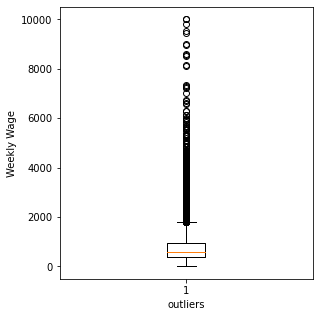

In [57]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.boxplot(df["Weekly Wage"])
plt.xlabel('outliers')
plt.ylabel("Weekly Wage")

On peut voir de nombreuses valeurs abbérantes, mais nous ne pouvons pas vérifier le salaire des individus. Nous ne pouvons donc pas supprimer ces valeurs. Il y a une forte disparité des salaires entre les 25% qui ont le salaire le plus élevé et le reste de la distribution. La majorité des individus ont un salaire inférieur à 2000 dollars par semaine. Les 25% les plus riches de la distribution, ont un salaire allant de 2000 à 8000 par semaine. (Un salaire égal a 10000 dollars par semaine paraît abbérant). 

Text(0, 0.5, 'claimant age')

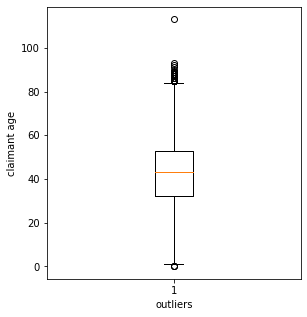

In [58]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.boxplot(df["Claimant Age"])
plt.xlabel('outliers')
plt.ylabel("claimant age")

On remarque une valeur abbérante, l'individu qui a plus de 100 ans. Nous ne pouvons pas supprimer ces lignes car cela est peut-être possible. L'âge médian de notre distribution est environ 40 ans. La majorité de notre population a entre 30 et 50 ans. 

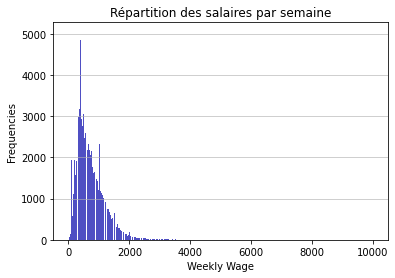

In [59]:
n, bins, patches = plt.hist(df["Weekly Wage"], bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Weekly Wage')
plt.ylabel('Frequencies')
plt.title("Répartition des salaires par semaine")
maxfreq = n.max()

Variable catégorielle :

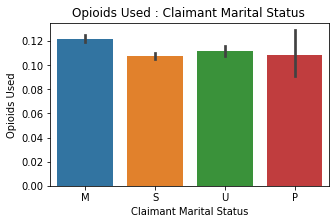

In [60]:
et = df.sort_values(by='Opiods Used', ascending=True)
figure = plt.figure(figsize=(5,3))
sns.barplot(y=df['Opiods Used'], x=df['Claimant Marital Status'])
plt.xticks()
plt.xlabel('Claimant Marital Status')
plt.ylabel('Opioids Used')
plt.title('Opioids Used : Claimant Marital Status ')
plt.show()

On peut remarquer que ce sont les individus mariés qui consomment le plus d'opioids. Notre première idée aurait été de dire que ce sont les individus célibataires (single), qui consomment le plus d'opioids. Le solitude peut inciter une plus grande la dépendance aux opioids. 

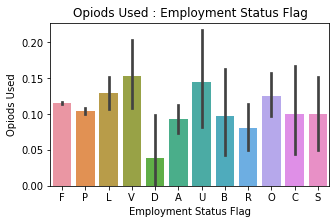

In [61]:
et = df.sort_values(by='Employment Status Flag', ascending=True)[:7000]
figure = plt.figure(figsize=(5,3))
sns.barplot(y=df['Opiods Used'], x=df['Employment Status Flag'])
plt.xticks()
plt.xlabel('Employment Status Flag')
plt.ylabel('Opiods Used')
plt.title('Opiods Used : Employment Status Flag')
plt.show()

In [62]:
pd.crosstab(df['Opiods Used'],df['Employment Status Flag'],normalize=True)*100

Employment Status Flag,A,B,C,D,F,L,O,P,R,S,U,V
Opiods Used,,,,,,,,,,,,
0,0.582624,0.068788,0.067130,0.040610,74.198788,0.582624,0.351398,12.162173,0.227082,0.103596,0.068788,0.155808
1,0.059671,0.007459,0.007459,0.001658,9.693273,0.087021,0.050555,1.412221,0.019890,0.011603,0.011603,0.028178


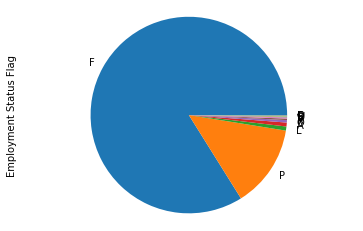

In [63]:
#Diagramme en secteurs : avant imputation 

df['Employment Status Flag'].value_counts(normalize=False).plot(kind='pie')
plt.axis('equal') 
plt.show() 

In [64]:
pd.crosstab(df['Opiods Used'],df['Claimant Marital Status'])

Claimant Marital Status,M,P,S,U
Opiods Used,,,,
0,40609,845,44033,21430
1,5646,103,5300,2695


In [65]:
df.groupby(['Opiods Used']).describe()

Claimant Age                                                       \
                   count       mean        std   min   25%   50%   75%    max   
Opiods Used                                                                     
0               106917.0  42.486200  13.413243   0.0  31.0  43.0  53.0  113.0   
1                13744.0  44.111685  11.103587  13.0  36.0  45.0  52.0   82.0   

            Number Dependents                                                \
                        count      mean       std  min  25%  50%  75%   max   
Opiods Used                                                                   
0                    106917.0  0.418315  1.002466  0.0  0.0  0.0  0.0  14.0   
1                     13744.0  0.548021  1.213518  0.0  0.0  0.0  0.0  11.0   

            Weekly Wage                                                  \
                  count        mean         std  min       25%      50%   
Opiods Used                                                               
0              106917.0  725.238486  488.866826  0.0  399.9500  605.600   
1               13744.0  676.128058  426.766100  0.0  383.7125  567.785   

                               Percent Impairment                            \
                  75%      max              count      mean        std  min   
Opiods Used                                                                   
0            970.9000  9999.99           106917.0  1.886463   5.715011  0.0   
1            880.5275  9465.38            13744.0  8.359793  11.554508  0.0   

                                   Post Injury Weekly Wage            \
             25%  50%   75%    max                   count      mean   
Opiods Used                                                            
0            0.0  0.0   0.0  100.0                106917.0  8.773705   
1            0.0  5.0  12.0  100.0                 13744.0  8.932240   

                                                    Surgery Flag            \
                   std  min  25%  50%  75%      max        count      mean   
Opiods Used                                                                  
0            95.166871  0.0  0.0  0.0  0.0  4881.36     106917.0  0.172115   
1            96.353481  0.0  0.0  0.0  0.0  3483.73      13744.0  0.529395   

                                               Neurology Payment Flag  \
                  std  min  25%  50%  75%  max                  count   
Opiods Used                                                             
0            0.377482  0.0  0.0  0.0  0.0  1.0               106917.0   
1            0.499153  0.0  0.0  1.0  1.0  1.0                13744.0   

                                                          \
                 mean       std  min  25%  50%  75%  max   
Opiods Used                                                
0            0.005920  0.076717  0.0  0.0  0.0  0.0  1.0   
1            0.037835  0.190803  0.0  0.0  0.0  0.0  1.0   

            Neurosurgery Payment Flag                                          \
                                count      mean       std  min  25%  50%  75%   
Opiods Used                                                                     
0                            106917.0  0.004022  0.063290  0.0  0.0  0.0  0.0   
1                             13744.0  0.040527  0.197198  0.0  0.0  0.0  0.0   

                 Dentist Payment Flag                                          \
             max                count      mean       std  min  25%  50%  75%   
Opiods Used                                                                     
0            1.0             106917.0  0.004957  0.070232  0.0  0.0  0.0  0.0   
1            1.0              13744.0  0.014406  0.119163  0.0  0.0  0.0  0.0   

                 Orthopedic Surgery Payment Flag                           \
             max                           count      mean       std  min   
Opiods Used                                          

L'âge moyen des consommateurs d'opioids est de 44 ans, ils ont un salaire par semaine dans la moyenne et il n'y a pas vraiment de différence significative entre les hommes et les femmes sur la consommation d'opioids. 
Les individus, en moyenne, qui ont consommé de l'opoids ont a 7% eut un accident qui a engendré des soins médicaux contre seulement 3% pour les individus qui n'ont pas consommé d'opoids. Consommer de l'opioids augmente alors en moyenne les chances d'être hospitalisé ou d'avoir besoin de soins médicaux. C'est également le cas en moyenne pour les analyses en laboratoire (13% contre 4%) et le fait d'avoir besoin d'une radio (4% contre 0%) ou d'être opérer (5% contre 2%). 

In [66]:
df.groupby(['Opiods Used', 'Claimant Sex']).mean()

Claimant Age  Number Dependents  Weekly Wage  \
Opiods Used Claimant Sex                                                 
0           F                43.451894           0.383917   607.991952   
            M                41.871517           0.442531   801.689356   
            U                40.794690           0.214159   723.074124   
1           F                44.752787           0.461334   533.824052   
            M                43.660070           0.611899   776.983041   
            U                44.203390           0.152542   572.585763   

                          Percent Impairment  Post Injury Weekly Wage  \
Opiods Used Claimant Sex                                                
0           F                       1.683417                 5.789292   
            M                       2.020472                10.756196   
            U                       1.699115                 4.559664   
1           F                       7.674394                 7.004475   
            M                       8.834578                10.353798   
            U                       9.355932                 0.000000   

                          Surgery Flag  Neurology Payment Flag  \
Opiods Used Claimant Sex                                         
0           F                 0.138003                0.007315   
            M                 0.194651                0.005048   
            U                 0.138053                0.001770   
1           F                 0.496018                0.043001   
            M                 0.554145                0.034478   
            U                 0.355932                0.000000   

                          Neurosurgery Payment Flag  Dentist Payment Flag  \
Opiods Used Claimant Sex                                                    
0           F                              0.003217              0.004718   
            M                              0.004566              0.005126   
            U                              0.001770              0.003540   
1           F                              0.034684              0.013272   
            M                              0.044810              0.015061   
            U                              0.016949              0.033898   

                          Orthopedic Surgery Payment Flag  \
Opiods Used Claimant Sex                                    
0           F                                    0.143555   
            M                                    0.193206   
            U                                    0.155752   
1           F                                    0.514068   
            M                                    0.572691   
            U                                    0.559322   

                          Psychiatry Payment Flag  Hand Surgery Payment Flag  \
Opiods Used Claimant Sex                                                       
0           F                            0.008363                   0.013700   
            M                            0.006725                   0.017272   
            U                            0.007080                   0.017699   
1           F                            0.089719                   0.030260   
            M                            0.087379                   0.028628   
            U                            0.033898                   0.084746   

                          Optometrist Payment Flag  Podiatry Payment Flag  \
Opiods Used Claimant Sex                                                    
0           F                             0.003312               0.024470   
            M                             0.004722               0.022615   
            U                             0.003540               0.019469   
1           F                             0.005309               0.094850   
            M                             0.007842               0.084640   
            U                    

On remarque que parmi les hommes qui ont consommé de l'opioids, 8,83% ont eu des conséquences graves et irréversible sur leurs santé contre 2% parmi les hommes qui n'en n'ont pas consommer. 

In [67]:
df['Opiods Used'].value_counts()

0    106917
1     13744
Name: Opiods Used, dtype: int64

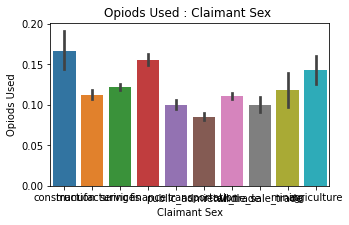

In [68]:
et = df.sort_values(by='SIC Group', ascending=True)[:7000]
figure = plt.figure(figsize=(5,3))
sns.barplot(y=df['Opiods Used'], x=df['SIC Group'])
plt.xticks()
plt.xlabel('Claimant Sex')
plt.ylabel('Opiods Used')
plt.title('Opiods Used : Claimant Sex ')
plt.show()

In [69]:
pd.crosstab(df["SIC Group"], df['Opiods Used'], normalize=True)

Opiods Used,0,1
SIC Group,,
agriculture,0.010061,0.001682
construction,0.006481,0.001293
finance,0.072642,0.013376
manufacturing,0.096336,0.012249
mining,0.006382,0.000854
public_admi,0.090029,0.010020
retail_trade,0.168754,0.021092
services,0.264725,0.036839
transportation,0.137518,0.012804


Ce sont dans les secteurs des services et du retail_trade qu'on trouve le plus de consommateurs d'opioids. Mais il n'y a pas de différence très significative. 

#### Etats des USA : statistiques 

In [70]:
pd.crosstab(df["Benefits State"], df['Opiods Used'], normalize=True)

Opiods Used,0,1
Benefits State,,
AL,0.008279,0.001210
AR,0.004111,0.000580
AZ,0.011570,0.001732
CA,0.133863,0.031543
CO,0.013998,0.004890
CT,0.033482,0.001641
DC,0.006315,0.000166
DE,0.002718,0.000315
FL,0.052950,0.015539


In [71]:
state_codes = pd.read_csv('/Users/florinepritzy/Documents/3 projets/usa_states.csv')
state_codes = state_codes[['usa_state','usa_state_code','usa_state_latitude','usa_state_longitude']]
state_codes= state_codes.dropna(subset=["usa_state"], axis=0, how='any')

In [72]:
df_states= pd.DataFrame(df[["Benefits State","Opiods Used"]])
df_states

,Benefits State,Opiods Used
0,OK,0
1,CO,1
3,IL,0
4,IL,0
5,CA,0
...,...,...
160609,NJ,0
160611,PA,0
160612,PA,0
160613,PA,1


In [73]:
df_states = df_states.merge(state_codes,left_on="Benefits State",right_on="usa_state_code",how="inner")
df_states 

,Benefits State,Opiods Used,usa_state,usa_state_code,usa_state_latitude,usa_state_longitude
0,OK,0,Oklahoma,OK,35.007752,-97.092877
1,OK,0,Oklahoma,OK,35.007752,-97.092877
2,OK,0,Oklahoma,OK,35.007752,-97.092877
3,OK,0,Oklahoma,OK,35.007752,-97.092877
4,OK,0,Oklahoma,OK,35.007752,-97.092877
...,...,...,...,...,...,...
120445,WY,0,Wyoming,WY,43.075968,-107.290284
120446,WY,0,Wyoming,WY,43.075968,-107.290284
120447,WY,0,Wyoming,WY,43.075968,-107.290284
120448,ND,0,North Dakota,ND,47.551493,-101.002012


Pour faire la carte : 

In [74]:
import plotly_express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

fig = px.choropleth(df_states , 
                    locations="usa_state_code", 
                    color = "Opiods Used",
                    locationmode = 'USA-states',
                    hover_name="usa_state",
                    range_color=[0,3],
                    color_continuous_scale = 'RdBu',#blues
                    scope="usa",
                    title='Opiods Abuse in USA'
                   )
fig.show()

In [ ]:
#pip install plotly-express